In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import ml_lit_anal as ml
import re
import nltk
import pickle
import operator
import google_scholar_parser as gs
import pandas as pd
import networkx as nx
import itertools
import matplotlib.pyplot as plt
import numpy as np
import graph_tool.all as gt

In [3]:
df = ml.load_records('data/machine_learning_WOS/')
df = ml.clean_topics(df)
df = ml.clean_fields(df)
df.shape

(28619, 63)

In [4]:
# loads my handcurated list of techniques
techniques_domains = pickle.load(open('technique_classification.pyd', 'r'))

# Analysis of decision tree, random forest, neural network and support vector machine 

The 'motivating intuition' here is that every major technique entails a manner of movement, handling and shaping of data _and_ this manner of movement affects how the technique itself travels or moves around. 

## Decision tree analysis

Hopefully I can do the analysis for decision trees, then just automate it for all the other techniques.

First of all, just check how they fit with related terms:

In [5]:
# get the records that keyword decision tree
dt = ml.keyword_years(df, 'decision tree')
print('decision tree: %d'%dt.shape[0])
## get the records that keyword CART
cart = ml.keyword_years(df, 'cart|classification and regression tree|classification tree')
print('CART: %d'%cart.shape[0])
# get the records that keyword C4.5
c45 = ml.keyword_years(df, 'C4.5')
print('C4.5: %d'%c45.shape[0])
rf = ml.keyword_years(df, 'random(.?)forest.?')
print('Random forests: %d'%rf.shape[0])

decision tree: 594
CART: 104
C4.5: 49
Random forests: 317


/usr/local/lib/python2.7/dist-packages/pandas/core/strings.py:189: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  " groups, use str.extract.", UserWarning)


In [6]:
#the intersection between these?
indexes = set(dt.index)
indexes.intersection(cart.index)
# very little intersection it seems

{2278, 7481, 10024, 14805, 15001, 15986, 19832, 20649}

Seems like only a few records overlap.

## How do decision tree topics appear over time?



In [ ]:
fig=plt.figure(figsize=(10,4))
plt.subplot(121)
years = (1990, 2012)
plt.hist(dt.PY, bins=20, alpha=0.2, range=years, label='decision tree')
plt.hist(cart.PY, bins=20, range=years, label='cart')
plt.hist(c45.PY, bins=20, range=years, label='C4.5')
plt.hist(rf.PY, bins=20,alpha=0.6, range=years,label='random forest' )
plt.title('Decision tree papers in machine learning literature')
plt.legend()
plt.subplot(122)
plt.hist(df.PY, bins=20, alpha=0.2)
plt.title('Machine learning overall')
plt.show()

This doesn't mean that there were no decision tree papers before 1990. They have been around longer, but were not presented as part of machine learning until then. And indeed the machine learning literature in general does not take shape until around then. (See the second plot).

So, did a WoS search just on decision trees and save the 3000 top-cited references. There were around 10,000 returned.  The problem with this search is that it is hard to know whether the decision tree is actually a software or algorithmic decision tree. That is, it might be a medical decision tree. 

In [152]:
dec_tree_df = ml.load_records('data/decision_tree_WOS/')
dec_tree_df = ml.clean_topics(dec_tree_df)

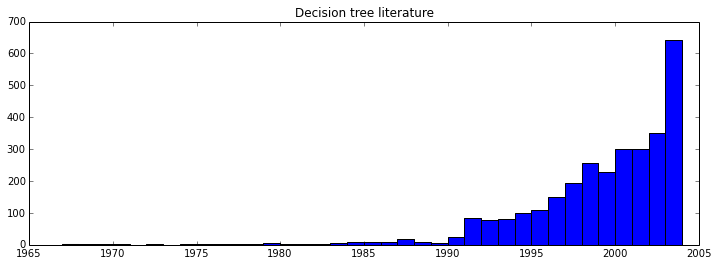

In [24]:
plt.figure(figsize=(12,4))
plt.title('Decision tree literature')
x = plt.hist(dec_tree_df.PY, bins=dec_tree_df.PY.max()-dec_tree_df.PY.min())

OK, this gives a different picture. Now the decision trees are much more numerous, and they span 1965 onwards. They were not developing only in the machine learning literature. They were going elsewhere. Nothing much was happening in them during 1960-1970s. But in the years after 1985, things really become much more active. 

In [25]:
dec_tree_df[['TI','PY', 'AF', 'TC']][(dec_tree_df.PY<1986) & (dec_tree_df.PY>=1977)]

,TI,PY,AF,TC
13,DECISION TREE CLASSIFIER - DESIGN AND POTENTIAL,1977,"SWAIN, PH; HAUSKA, H",80
14,FUZZY DECISION TREE ALGORITHMS,1977,"CHANG, RLP; PAVLIDIS, T",48
15,EFFICIENT DECISION TREE DESIGN FOR DISCRETE VA...,1977,"SETHI, IK; CHATTERJEE, B",12
16,PLAN BALANCE SHEETS BASED ON DECISION TREE AND...,1977,"METZ, M; SELL, A",0
17,DECISION TREE APPROACH TO DECIDE WHEN TO USE D...,1978,"POSNER, BZ; RANDOLPH, WA",1
18,ESTIMATION OF TOXIC HAZARD - DECISION TREE APP...,1978,"CRAMER, GM; FORD, RA; HALL, RL",172
19,PEST-CONTROL DECISIONS BY DECISION TREE ANALYSIS,1978,"TALERICO, RL; NEWTON, CM; VALENTINE, HT",6
20,DECISION TREE ANALYSES OF EXPLORATION ACTIVITIES,1979,"SPROWSO, ME; PUGH, PJ; NEKHOM, M",0
21,OBJECTIVE-TYPE FORECAST DECISION TREE FOR THE ...,1979,"HARTZELL, CL; POLITTE, FE",0
22,USE OF A DECISION TREE TO IMPROVE ACCURACY OF ...,1979,"ASPINALL, MJ",34


Still problems here. Important people like Friedman and Breiman don't appear here. Why not? How are they keyworded? Not by decision tree it seems.

Might be worth tracking in by different routes. 

1. The Morgan-Sonquist citations -- who cited them?
2. The Cover-Hart nearest neighbour work -- how does it allow the technique to be renovated?

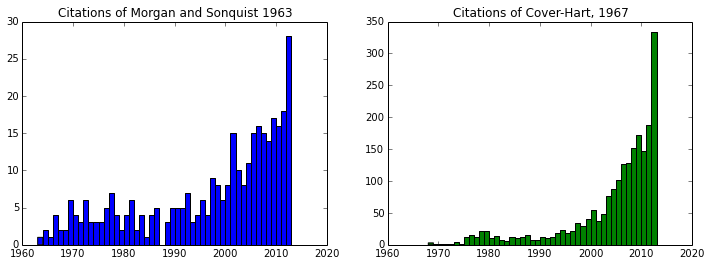

In [21]:
morgan_df = ml.load_records('data/morgan_sonquist_WOS/')
figure = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.hist(morgan_df.PY, bins=morgan_df.PY.max()-morgan_df.PY.min())
plt.title('Citations of Morgan and Sonquist 1963')
cover_df = ml.load_records('data/cover_hart_WOS/')
plt.subplot(122)
plt.hist(cover_df.PY, color = 'g', bins=cover_df.PY.max()-cover_df.PY.min())
plt.title('Citations of Cover-Hart, 1967')
figure.remove

Both Morgan-Sonquist and Cover-Hart show a huge increase in the last decade or so, although on different scales. It would be interesting to see how they intersect.

In [39]:
set(cover_df.UT).intersection(set(morgan_df.UT))


{'WOS:000076437400008',
 'WOS:000267023600010',
 'WOS:000280500600001',
 'WOS:000304257400003',
 'WOS:A1977DN67300001'}

## Decision trees 1985-2000

I'd like to see what was happening with the topics and applications of decision trees between 1980s-2012. Maybe this is already too late, given that the work on decision trees had been done much earlier. But it is a starting point.

In [71]:
dec_tree_df[['TI','PY', 'AF', 'TC']][(dec_tree_df.PY<2000) & (dec_tree_df.PY>=1986)].head(10)

,TI,PY,AF,TC
59,MANAGEMENT OF A PATIENT RECOVERING FROM MYOCAR...,1986,"BUSH, DE; HEALY, B",0
60,DECISION TREE ANALYSIS IN THE STRATEGICAL PLAN...,1986,"BRAUN, GE",0
61,A BINARY DECISION TREE ON SILICIUM,1986,"THUAU, G; SAUCIER, G",0
62,MORTGAGE SELECTION USING A DECISION TREE APPROACH,1986,"LUNA, RE; REID, RA",5
63,AN AUTOMATED APPROACH TO THE DESIGN OF DECISIO...,1986,"KIM, BS; PARK, SB",0
64,WHEN IS A DIAGNOSTIC-TEST RESULT POSITIVE - DE...,1986,"KRIEG, AF; ABENDROTH, TW; BONGIOVANNI, MB",6
65,DECISION-MAKING BASED ON DECISION TREE ANALYSI...,1986,"BABICH, GK",0
66,EPIDEMIOLOGIC PROGRAMS FOR COMPUTERS AND CALCU...,1986,"CARPENTER, TE",5
67,AN EVALUATION OF THE DECISION TREE APPROACH FO...,1986,"PHILLIPS, JC; WATTS, P; PURCHASE, R; GANGOLLI, SD",1
68,A POLYNOMIAL-TIME LINEAR DECISION TREE FOR THE...,1987,"KOLINEK, M",0


Also, it might be worth looking at the intersection between machine learning decision trees and decision trees in general. How much do they overlap?

In [67]:
# using WoS ids to do this: df.UT
ml_dt = set(df.UT.unique())
dt_dt = set(dec_tree_df.UT.unique())
print("""there are %d references to decision tree articles in the machine learning literature;
even though there are at least %d articles in the machine learning set on decision trees"""
      %(len(dt_dt.intersection(ml_dt)), dt.shape[0]))

there are 309 references to decision tree articles in the machine learning literature;
even though there are at least 513 articles in the machine learning set on decision trees


This difference -- 309 vs 513 -- could be because the decision tree dataset is not complete. In any case, it supports the conclusion that much of the decision tree has not been labelled as 'machine learning.'

# Analysis of techniques in the decision tree literature

In [40]:
# get all the techniques from my list of techniques 
techniques = [key for key, value in techniques_domains.iteritems() if value == 'y']

# find all the domains/topics in the list of decision tree topics that are not techniques
dt_topics = df.topics.ix[dt.index]

def remove_techniques(x):
    return [top for top in x if top not in techniques]
dt_topics = dt_topics.apply(remove_techniques)
dt_df = df.ix[dt_topics.index].groupby(df['PY'])
dt_df



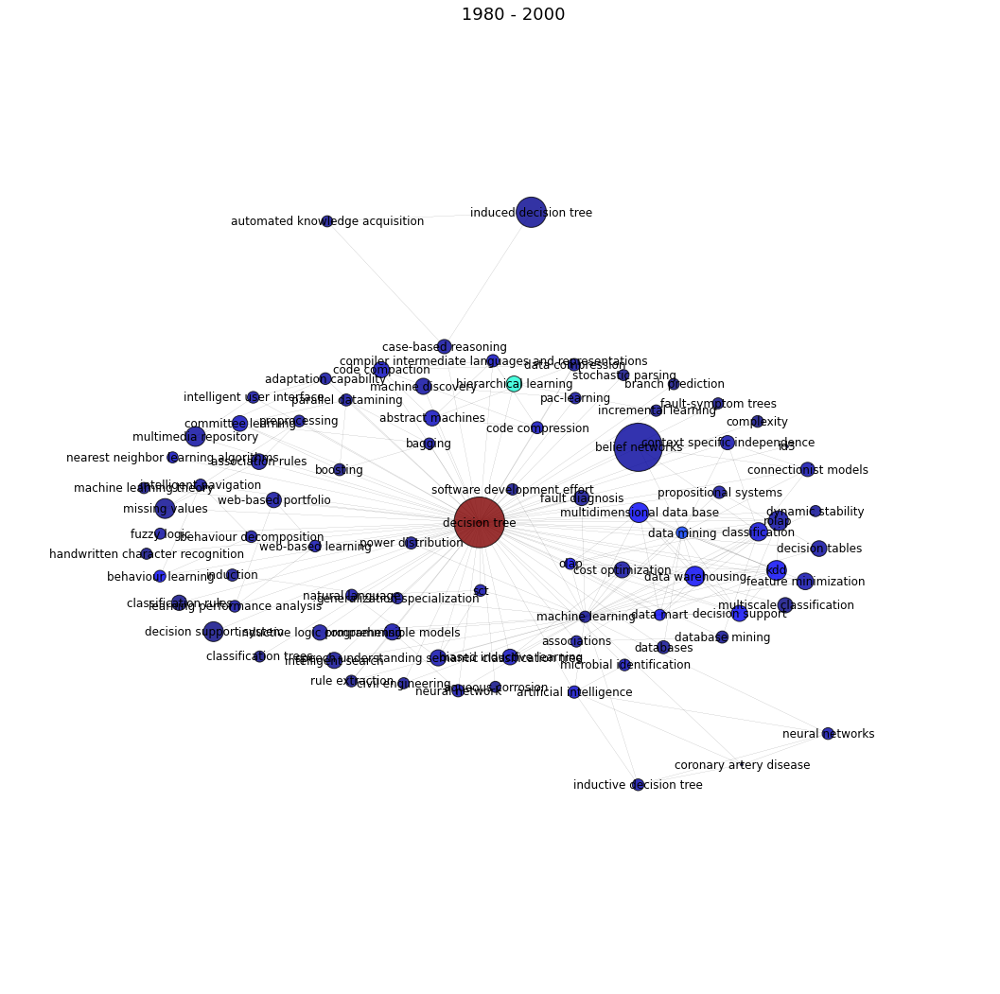

In [27]:
ml.term_year_network(dt, 'decision tree', 1980, 2000, (18,18), plot=True)

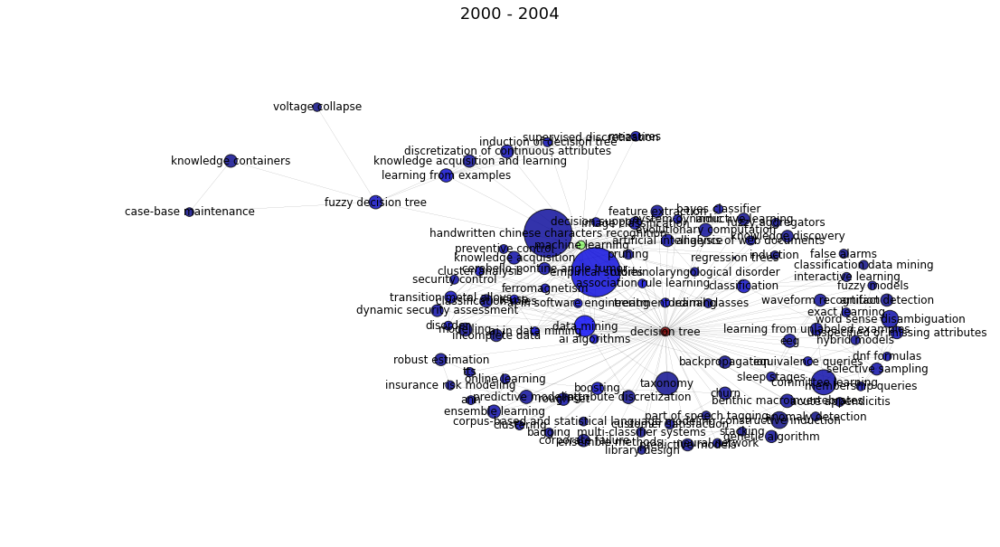

In [28]:
dt_nx_2004 = ml.term_year_network(dt, 'decision tree', 2000, 2004, (19,10))

In [5]:
dt_all_g = ml.coword_network_fast(dt, 1990, 2000)


Dropped 0 document of the total 57 because they had no topic field


## Random forest

How do they get taken up?

In [20]:
rf_df = ml.keyword_years(df, 'random forest.?|randomForest.?')
rf_df.head()

,topics,PY,DE
264,"[object-based image analysis, random forest, s...",2012,object-based image analysis; random forest; su...
369,"[hand detection, decision tree]",2012,Hand detection; decision trees; random forest
402,"[data center, temperature sensors, crac, therm...",2012,data center; temperature sensors; CRAC; therma...
763,"[data mining, financial fraud, partially adapt...",2012,data mining; financial fraud; partially adapti...
769,"[alcohol withdrawal, seizure, homocysteine, de...",2012,Alcohol withdrawal; Seizure; Homocysteine; Det...


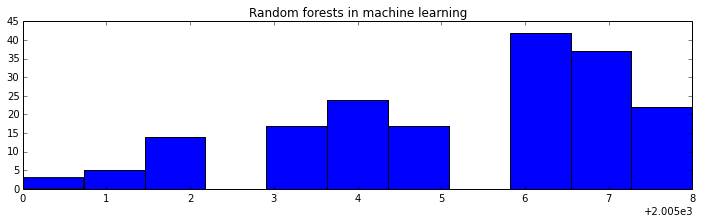

In [15]:
plt.figure(figsize=(12,3))
plt.hist(rf_df.PY, bins=11)
plt.title('Random forests in machine learning')

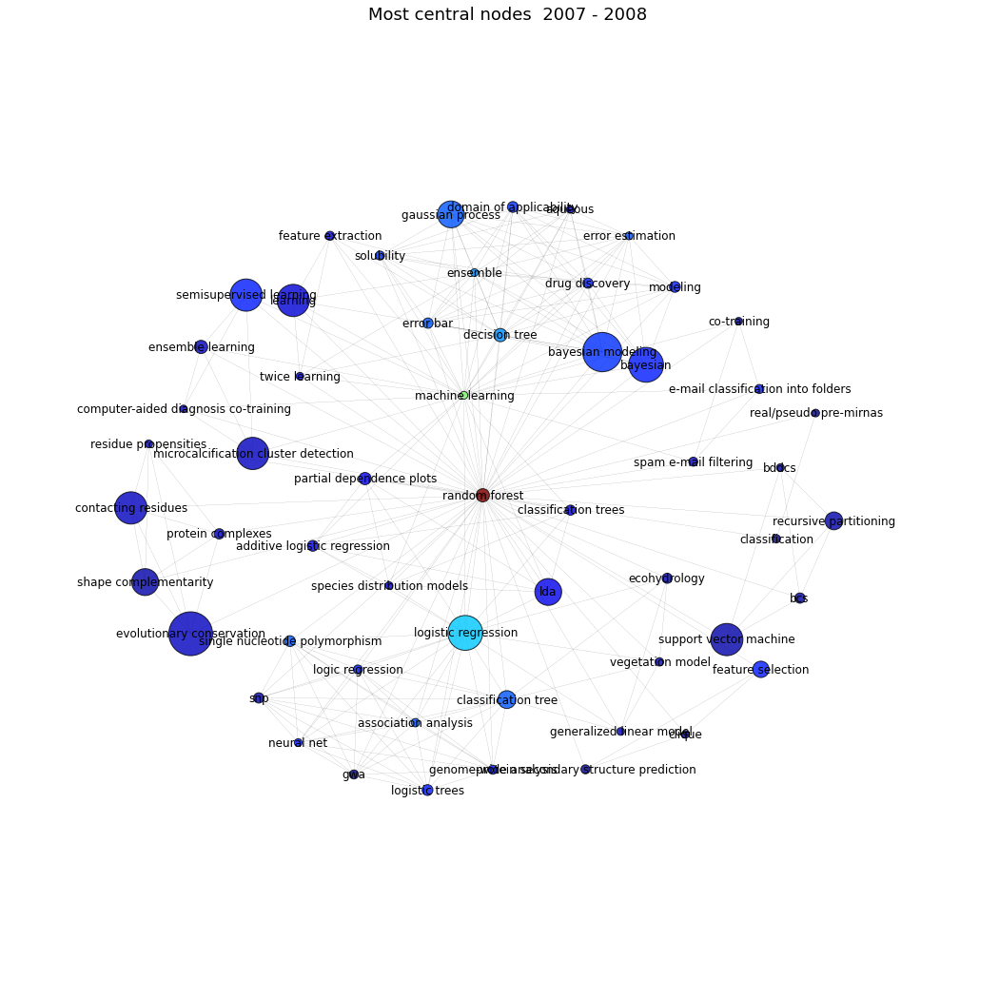

In [21]:
ml.term_year_network(rf_df, 'random forest', 2007, 2008)

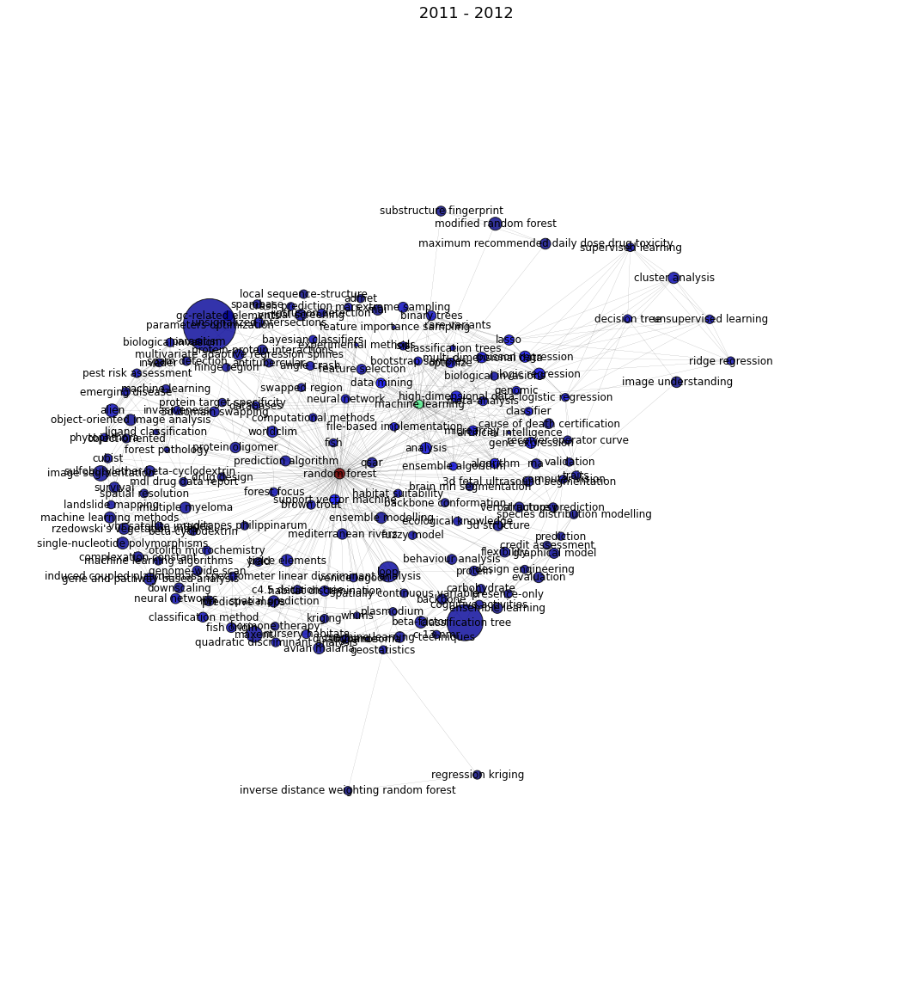

In [27]:
ml.term_year_network(rf_df, 'random forest', 2011, 2012, (18, 20))

# Support vector machine

Trying to see how this literature takes shape

In [4]:
svm_df = ml.keyword_years(df, 'support vector|support vector machine.?|svm|support vector network.?')
svm_df.shape

(1882, 3)

SVMs contribute a substantial portion of the growth in SVM during the last decade. They dwarf random forests. 

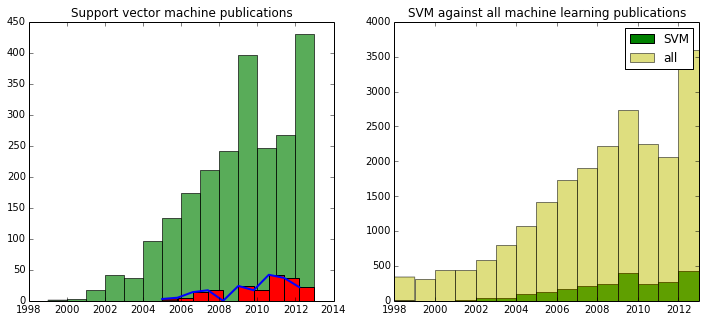

In [19]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.title('Support vector machine publications')
x,y,z = plt.hist(svm_df.PY, color='g',bins  = svm_df.PY.max() - svm_df.PY.min(), 
                 label= 'SVM', alpha=0.65, hold='on')
x,y,z = hist(rf_df.PY, color='r', label='random forest')
plt.plot(y[:-1],x, linewidth=2)

plt.subplot(122)
bins = 2013-1998
plt.hist(svm_df.PY,color='g', bins = bins, hold='on', label='SVM', range=(1998,2013))
plt.hist(df.PY, alpha=0.5, color='y', label='all', bins = bins,  range=(1998,2013))
plt.xlim(1998, 2013)
plt.legend()
plt.title('SVM against all machine learning publications')

Cortes is meant to be one of the most highly cited papers in the literature. Some sign of that. 

In [88]:
cortes_cit = ml.find_citation(df, 'Cortes 1995')
cortes_cit.shape

(799, 60)

In [92]:
cortes = gs.ScholarQuerier(author = 'Corinna Cortes', count=50)
res = cortes.query('')


In [97]:
type(cortes) ## not working

instance

In [109]:
cortes_df = ml.find_author(df, '(Cortes)|(Vapnik)')
cortes_df.shape

(23, 60)

In [110]:
cortes_topics = ml.keyword_counts(cortes_df).keys()

In [111]:
c1 = ml.coword_network(cortes_df, 1995, 2013, 200)

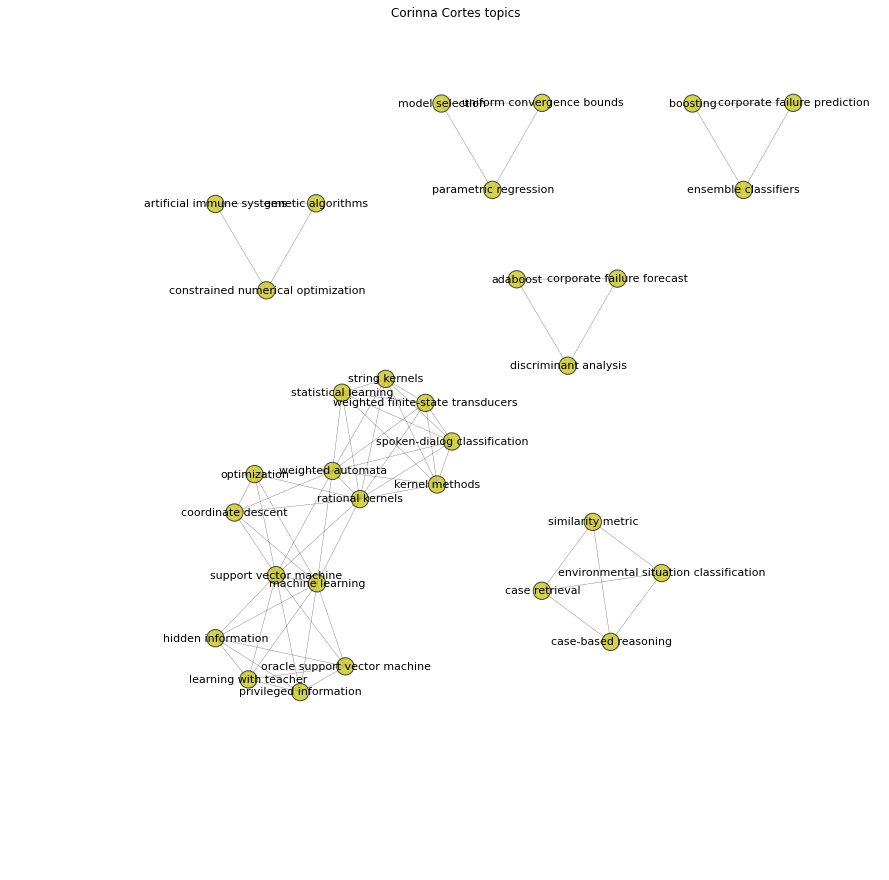

In [112]:
plt.figure(figsize=(15,15))
plt.title('Corinna Cortes topics')
nx.draw_graphviz(c1, with_labels=True, 
                 alpha = 0.7,
                 node_color = 'y',
                 width=0.3,
                 font_size=11,
                 labels = nx.get_node_attributes(c1, 'topic'))

In [115]:
cortes_nx = ml.coword_network(cortes_df, 1995, 2012, 500)


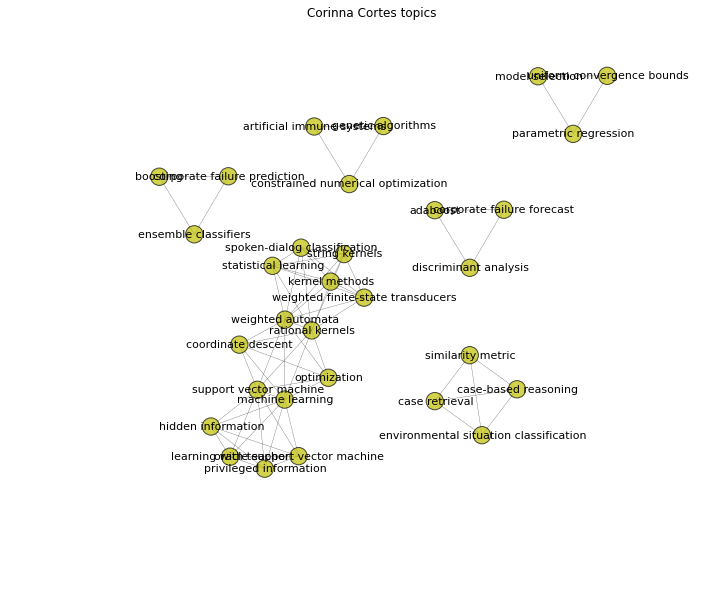

In [116]:
plt.figure(figsize=(12,10))
plt.title('Corinna Cortes topics')
nx.draw_graphviz(cortes_nx, with_labels=True, 
                 alpha = 0.7,
                 node_color = 'y',
                 width=0.3,
                 font_size=11,
                 labels = nx.get_node_attributes(cortes_nx, 'topic'))

But I don't see Cortes and Vapnik, 1995 here. That is the important paper, published in the journal _Machine Learning_. What happened to it?

## Network analysis of SVM literature


There are around 4000 keywords in the literature. 

In [60]:
svm_df_lim = svm_df.ix[svm_df.PY <2006]
svm_df_lim.shape


(275, 3)

In [178]:
def term_year_network(svm_df, topic, start, end, size = (18,18)):
    svm_nx = ml.coword_network(svm_df, start, end)

    svm_cow = nx.to_numpy_matrix(svm_nx)
    topics = nx.get_node_attributes(svm_nx, 'topic')
    eigen = nx.eigenvector_centrality(svm_nx)
    #[(i[0], svm_nx_2004.node[i[0]].values()) for i in ml.sorted_map(eigen_2004)[:20]]
    class_nx = nx.ego_graph(svm_nx, nxkey_for_topic(topic, topics), undirected=True, radius=20)

    ml.plot_co_x(class_nx, start, end, size)
    return class_nx

In [177]:
def nxkey_for_topic(topic, topics):
    return [k[0] for k in topics.items() if k[1] == topic][0]

## SVM: pre-2000

In [69]:
svm_nx_2000 = ml.coword_network(svm_df, 1995, 2000)
svm_2000_cow = nx.to_numpy_matrix(svm_nx_2000)

In [114]:
topics_2000 = nx.get_node_attributes(svm_nx_2000, 'topic')
eigen_2000 = nx.eigenvector_centrality(svm_nx_2000)
[(i[0], svm_nx_2000.node[i[0]].values()) for i in ml.sorted_map(eigen_2000)[:20]]

{0: "'hard' and 'soft' variables",
 1: '1-d gel electrophoresis',
 2: '1-norm',
 3: '1-rule',
 4: '1-vs-set machine',
 5: '10-fald cross validation',
 6: '3d avatars',
 7: '3d facial expression classification',
 8: '3d graphical environment',
 9: '3d graphical models',
 10: '3d image reconstruction algorithm styling',
 11: '3d object recongnition',
 12: '3d trunk modeling',
 13: '5-ht1a receptor',
 14: 'a posteriori snr',
 15: 'a priori snr',
 16: 'abc-transporter',
 17: 'abcb1',
 18: 'abnormal event detection',
 19: 'abnormality detection',
 20: 'above ground biomass',
 21: 'accelerated test',
 22: 'access control',
 23: 'accessible surface area',
 24: 'accumbens',
 25: 'accuracy rate',
 26: 'acetylcholinesterase',
 27: 'acid mine drainage',
 28: 'acid rock drainage',
 29: 'acoustic emission',
 30: 'acronym extraction',
 31: 'active appearance models',
 32: 'active compound',
 33: 'active learning',
 34: 'active measurements',
 35: 'active sites',
 36: 'activity of daily living',
 37:

In [142]:
key_for_topic('support vector machine', topics_2000)

3931

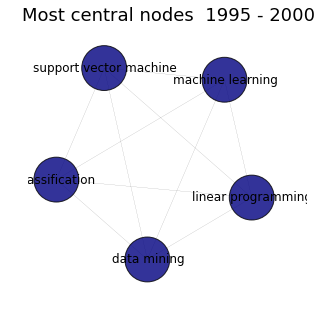

In [143]:
# plot ego graph for svm
term_year_network(svm_df, 'support vector machine', 1995, 2000, (5,5))

## SVM: year by year

## SVM: 2000-2

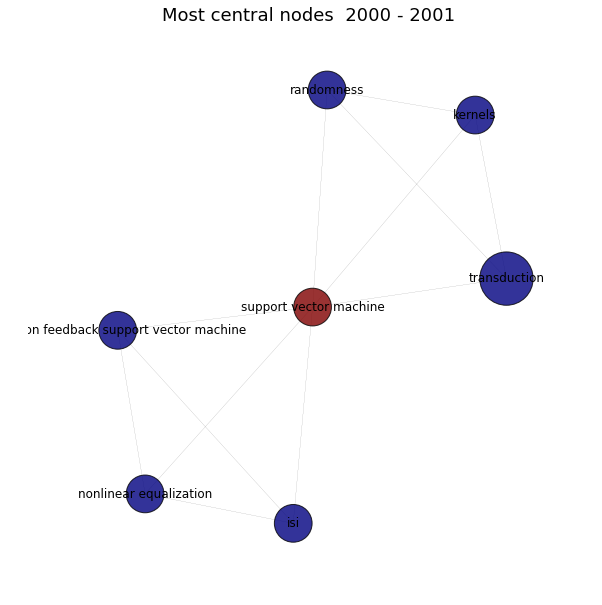

In [147]:

svm_nx_2002 = term_year_network(svm_df, 'support vector machine', 2000, 2001, (10,10))


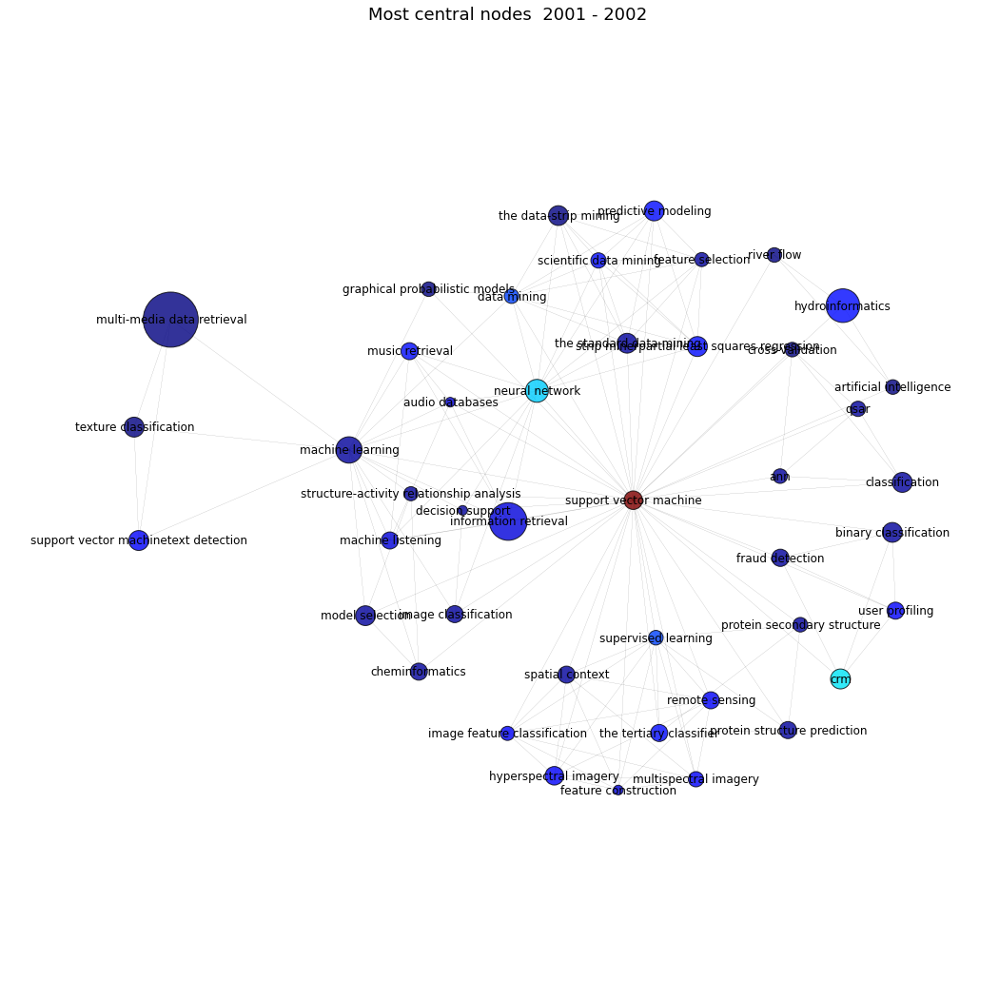

In [146]:
svm_nx_2002 = term_year_network(svm_df, 'support vector machine', 2001, 2002)

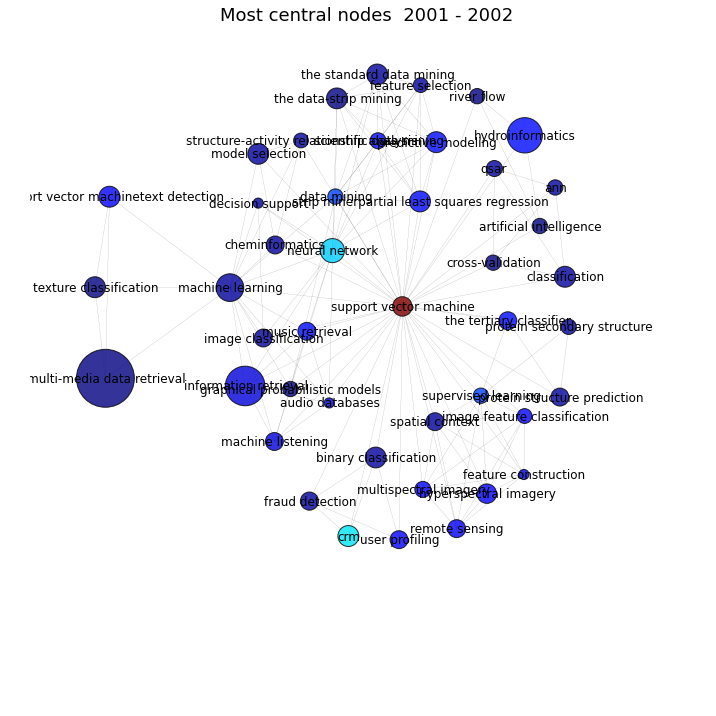

In [135]:
term_year_network(svm_df, 2001, 2002, (12,12))

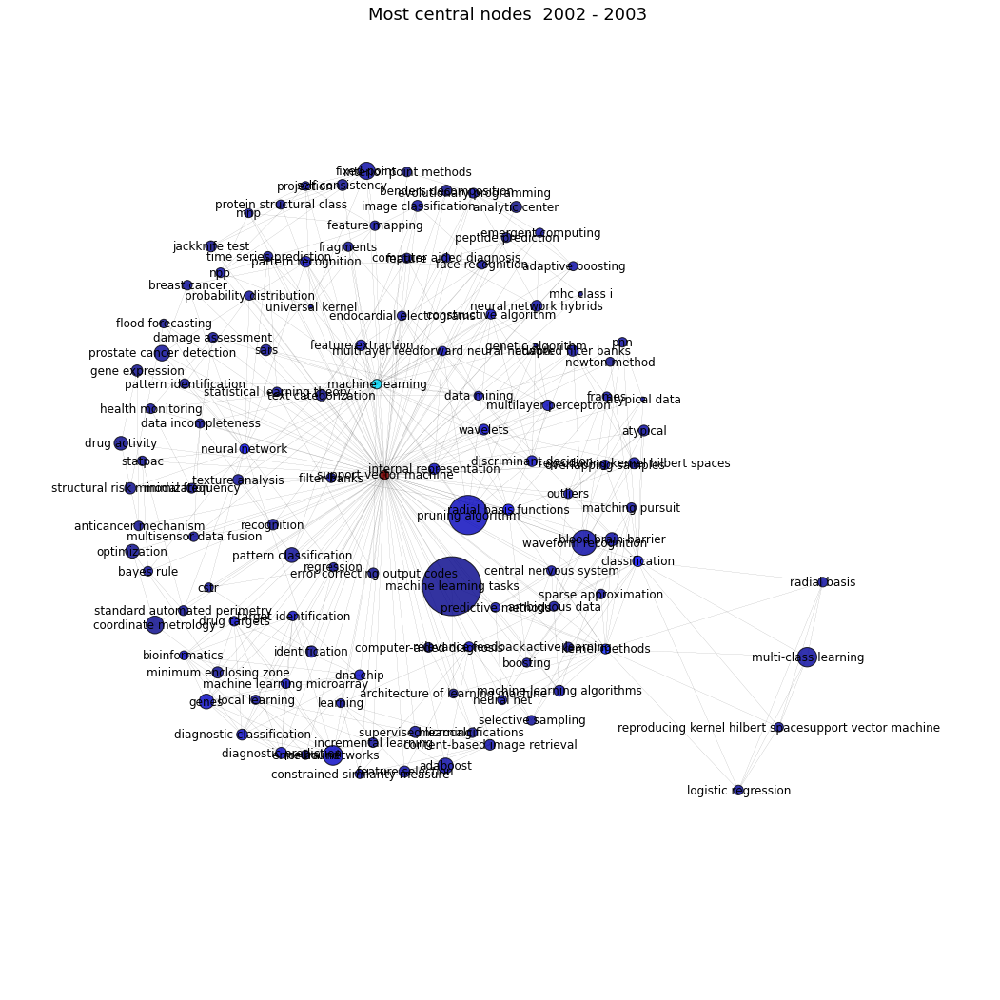

In [125]:
svm_year_plot(svm_df, 2002,2003)

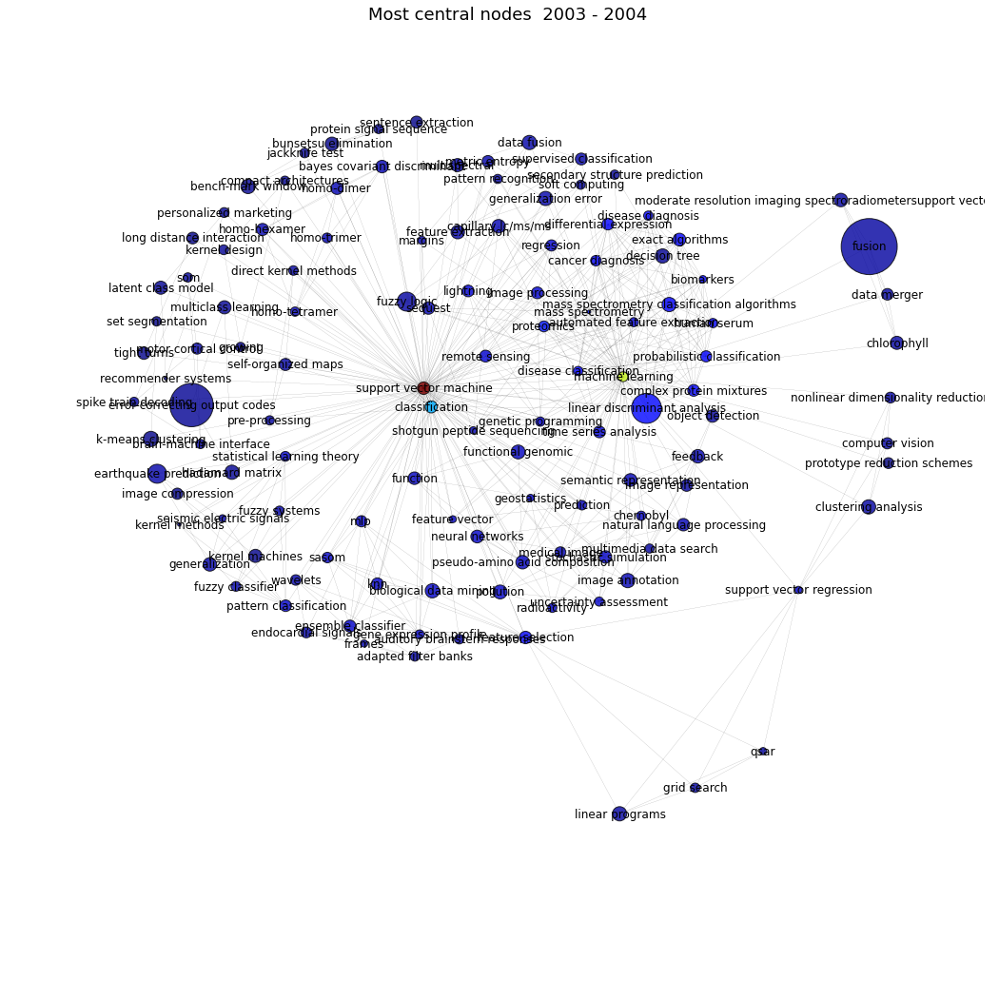

In [126]:
svm_year_plot(svm_df, 2003, 2004)

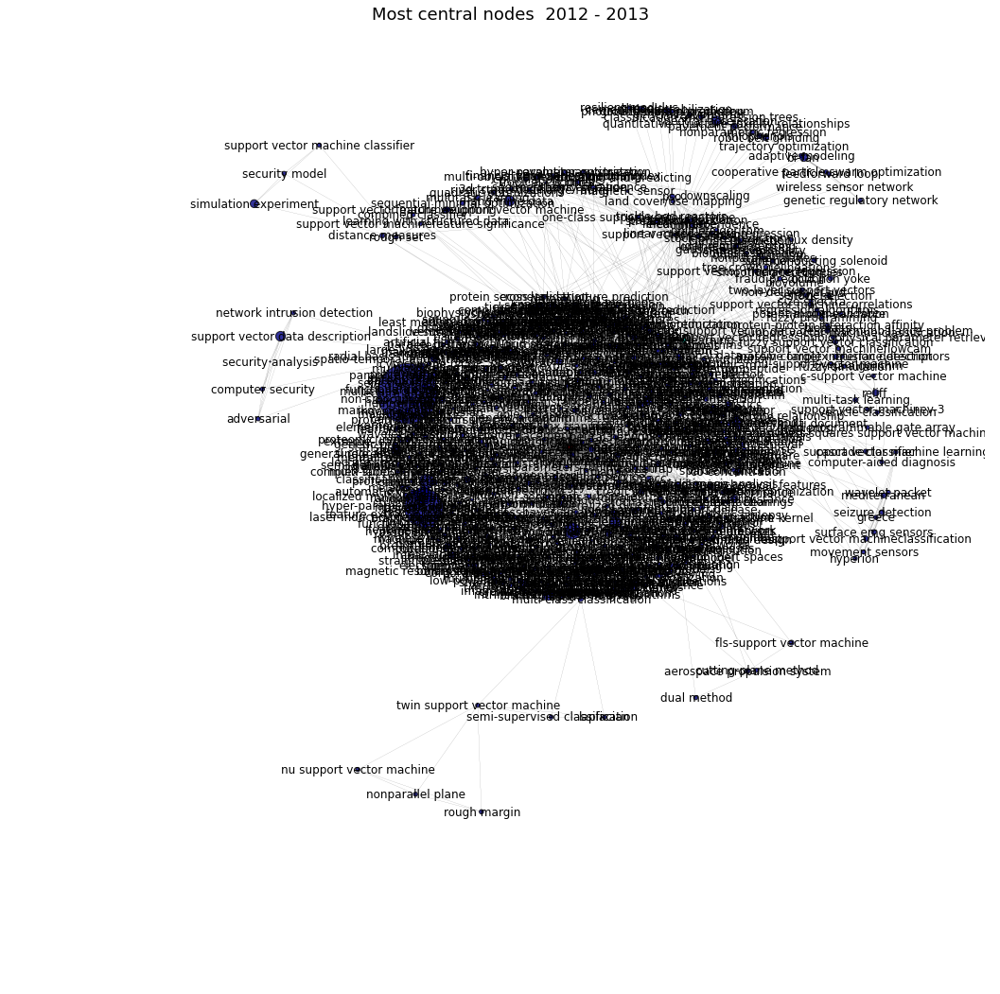

In [149]:
svm_nx_2013 = term_year_network(svm_df, 'support vector machine', 2012, 2013)

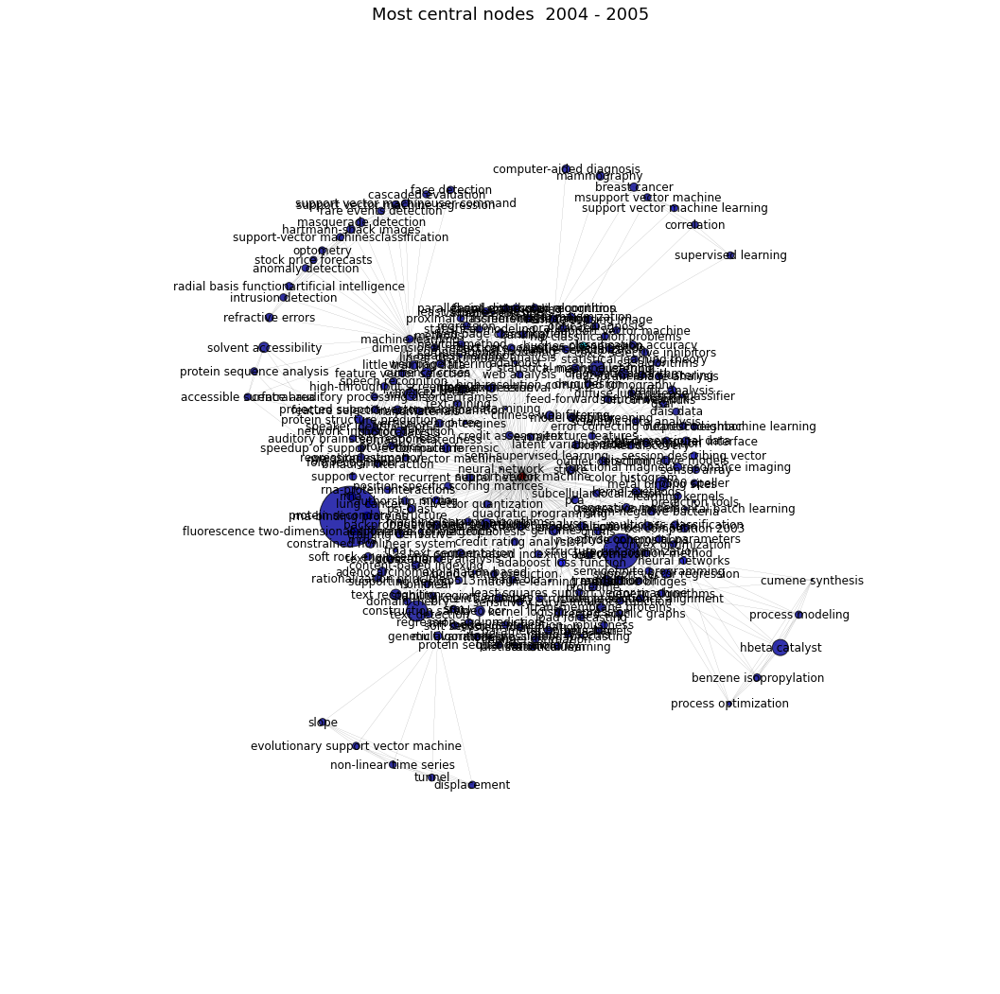

In [127]:
term_year_network(svm_df, 'support vector machine', 2004, 2005)

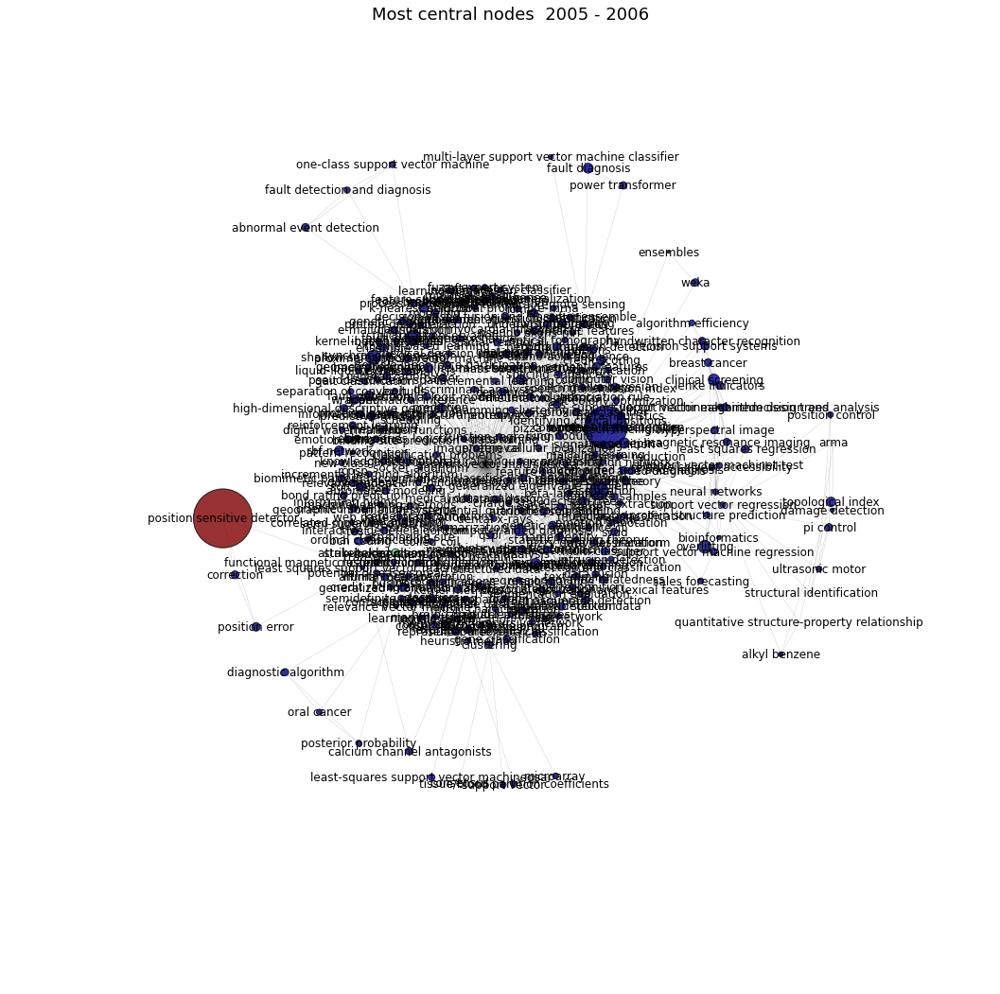

In [128]:
svm_year_plot(svm_df, 2005,2006)

## SVM: 2004-6

In [87]:
#looking at 2000 top topics for the moment
svm_nx_2006 = ml.coword_network(svm_df, 2004, 2006, 2000)

svm_2006_cow = nx.to_numpy_matrix(svm_nx_2006)

In [88]:
topics_2006 = nx.get_node_attributes(svm_nx_2006, 'topic')
eigen_2006 = nx.eigenvector_centrality(svm_nx_2006)
[(i[0], svm_nx_2006.node[i[0]].values()) for i in ml.sorted_map(eigen_2006)[:20]]

[(0, ['support vector machine']),
 (1, ['machine learning']),
 (2, ['classification']),
 (3, ['neural network']),
 (5, ['feature selection']),
 (6, ['data mining']),
 (53, ['incremental learning']),
 (23, ['decision trees']),
 (56, ['text mining']),
 (26, ['adaboost']),
 (77, ['text categorization']),
 (172, ['weighted support vector machine']),
 (65, ['proteomics']),
 (66, ['computer-aided diagnosis']),
 (11, ['genetic algorithm']),
 (8, ['kernel methods']),
 (18, ['genetic algorithms']),
 (57, ['modeling']),
 (623, ['semantic relatedness']),
 (258, ['network intrusion detection'])]

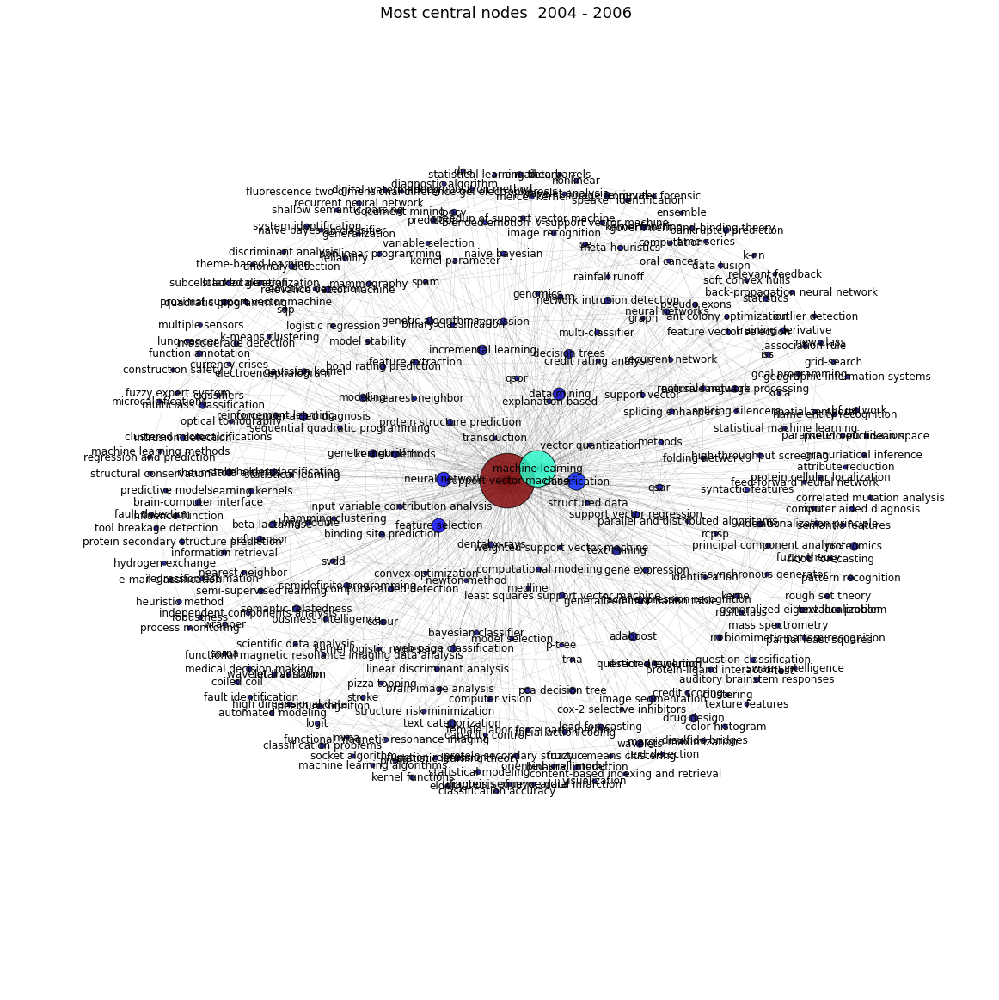

In [102]:
# ego network for svm
class_nx = nx.ego_graph(svm_nx_2006, n=0, center=True)
ml.plot_co_x(class_nx, 2004, 2006, (20,20))

In [126]:
svm_nx_2006_trim = ml.trim_degrees(svm_nx_2006, 1)
len(svm_nx_2006_trim.nodes())

315

In [127]:
svm_nx_2006_trim = ml.trim_edges(svm_nx_2006_trim,2)
svm_nx_2006_trim = ml.trim_degrees(svm_nx_2006_trim, 2)

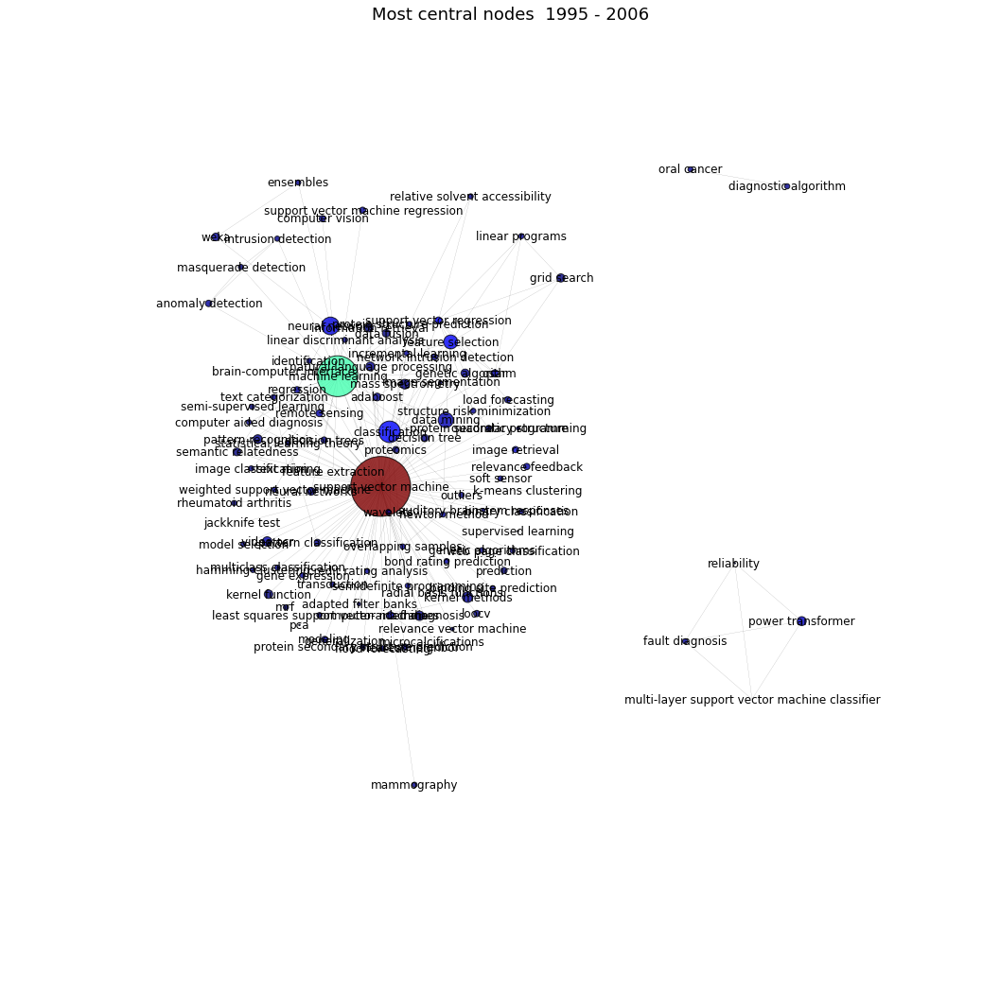

In [128]:

ml.plot_co_x(svm_nx_2006_trim, 1995, 2006, (18,18))

In [101]:
ml.sorted_map(nx.betweenness_centrality(svm_nx))

[(620, 0.7513793232431573),
 (149, 0.16798210812584544),
 (526, 0.07249863163434346),
 (107, 0.03527086655543427),
 (450, 0.030709793066114988),
 (689, 0.01780327452126098),
 (557, 0.01704787234042553),
 (698, 0.012780276605777068),
 (190, 0.012492206279674987),
 (236, 0.008406019056558798),
 (755, 0.00731226533166458),
 (277, 0.007312265331664579),
 (500, 0.006944907128149442),
 (168, 0.006343749330367403),
 (246, 0.006151221525607229),
 (426, 0.005411842164579969),
 (392, 0.005064333000423512),
 (566, 0.004861135477425144),
 (719, 0.004774731045223933),
 (346, 0.004175910951098697),
 (534, 0.004100226246032043),
 (718, 0.004044987041714887),
 (491, 0.00375627674630334),
 (584, 0.003551086624576923),
 (472, 0.0034926636010237187),
 (762, 0.0034608950498328976),
 (143, 0.0027696564056858275),
 (523, 0.0027675107276953345),
 (192, 0.0024844924231657746),
 (163, 0.0024499374217772213),
 (702, 0.0024295994993742175),
 (769, 0.0024295994993742175),
 (171, 0.002340125057115047),
 (632, 0.00

## SVM: 2007-8

In [129]:
svm_nx_2008 = ml.coword_network(svm_df, 2007, 2008)

In [130]:
svm_nx_2008.number_of_nodes()

4402

In [132]:
topics_2008 = nx.get_node_attributes(svm_nx_2008, 'topic')
eigen_2008 = nx.eigenvector_centrality(svm_nx_2008)
[(i[0], svm_nx_2008.node[i[0]].values()) for i in ml.sorted_map(eigen_2008)[:20]]

[(3931, ['support vector machine']),
 (2204, ['machine learning']),
 (2634, ['neural network']),
 (532, ['classification']),
 (881, ['decision tree']),
 (1522, ['genetic algorithms']),
 (2903, ['pattern classification']),
 (3273, ['random forest']),
 (986, ['distance']),
 (1024, ['domain of applicability']),
 (1040, ['drug discovery']),
 (1152, ['ensemble']),
 (1189, ['error bar']),
 (1196, ['error estimation']),
 (1470, ['gaussian process']),
 (1297, ['feature selection']),
 (850, ['data mining']),
 (180, ['artificial intelligence']),
 (2907, ['pattern recognition']),
 (2639, ['neural networks'])]

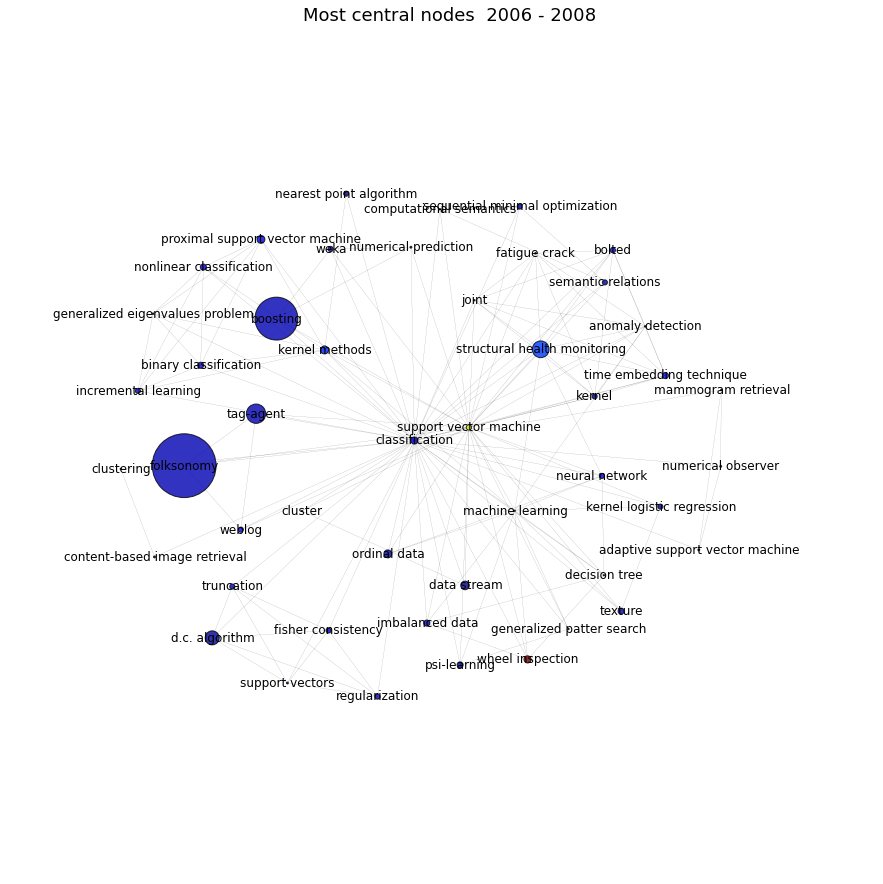

In [134]:
class_nx = nx.ego_graph(svm_nx_2008, 532)
#class_nx = nx.ego_graph(svm_nx, 1449)
ml.plot_co_x(class_nx, 2006, 2008, (15,15))

# Experiments with inclusion, proximity and equivalence scores

In [23]:
## try inclusion matrix
svm_2006_cow_inc = ml.inclusion_matrix(svm_2006_cow)

4000000


In [24]:
#svm_2006_cow_inc[np.isnan(svm_2006_cow_inc)]=0

In [53]:
#set diagonal to zero 
np.fill_diagonal(svm_2006_cow_inc,0)

In [54]:
inc_edges = ml.inclusion_matrix_to_edge_weights(svm_2006_cow_inc)
nx.set_edge_attributes(svm_nx_2006, 'inclusion', inc_edges)

In [55]:
inc_edges_sorted = ml.sorted_map(inc_edges)

In [63]:
{(topics_2006[x[0]], topics_2006[x[1]]):v for x,v in inc_edges_sorted[:30]}

{('support vector machine', 'active learning'): 1.0,
 ('support vector machine', 'adaboost'): 1.0,
 ('support vector machine', 'artificial intelligence'): 1.0,
 ('support vector machine', 'binary classification'): 1.0,
 ('support vector machine', 'boosting'): 1.0,
 ('support vector machine', 'data mining'): 1.0,
 ('support vector machine', 'decision tree'): 1.0,
 ('support vector machine', 'decision trees'): 1.0,
 ('support vector machine', 'feature extraction'): 1.0,
 ('support vector machine', 'image classification'): 1.0,
 ('support vector machine', 'image processing'): 1.0,
 ('support vector machine', 'incremental learning'): 1.0,
 ('support vector machine', 'information retrieval'): 1.0,
 ('support vector machine', 'k-nn'): 1.0,
 ('support vector machine', 'kernel'): 1.0,
 ('support vector machine', 'kernel function'): 1.0,
 ('support vector machine', 'modeling'): 1.0,
 ('support vector machine', 'multiclass classification'): 1.0,
 ('support vector machine', 'natural language proc

In [57]:
# draw graph of most inclusive nodes

elarge=[(u,v) for (u,v,d) in svm_nx_2006.edges(data=True) if d['inclusion'] ==1]

In [58]:
svm_2006_nx_inc = nx.Graph(elarge)

In [59]:
svm_2006_nx_inc.number_of_edges()

1605

In [60]:
svm_2006_nx_inc.number_of_nodes()

452

In [61]:
labels_inc = {n: topics_2006[n] for n in svm_2006_nx_inc.nodes()}

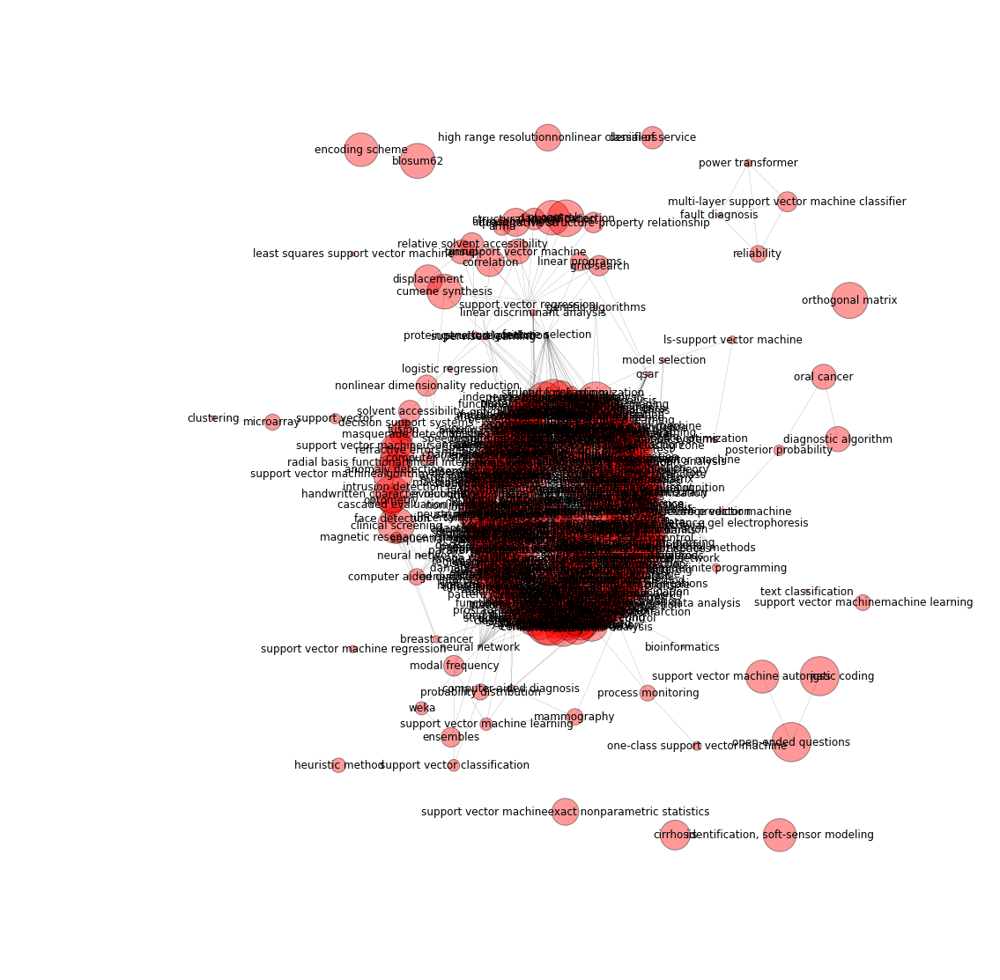

In [62]:
plt.figure(figsize=(15,15))
nx.draw_graphviz(svm_2006_nx_inc, 
                 with_labels = True,
                 labels = labels_inc,
                 node_size = [s for s in nx.betweenness_centrality(svm_2006_nx_inc)],
                 width=0.3,
                 alpha=0.4)

In [65]:
np.unravel_index(svm_2006_cow_inc.argmax(), svm_2006_cow_inc.shape)

(0, 6)

In [68]:
np.where(svm_2006_cow_inc == 1.0)[0].shape

(1, 2306)

In [22]:
most_inclusive_node = nx.ego_graph(svm_nx_2006,11,5)

In [20]:
topics[845]

'support vector machine (support vector machine)'

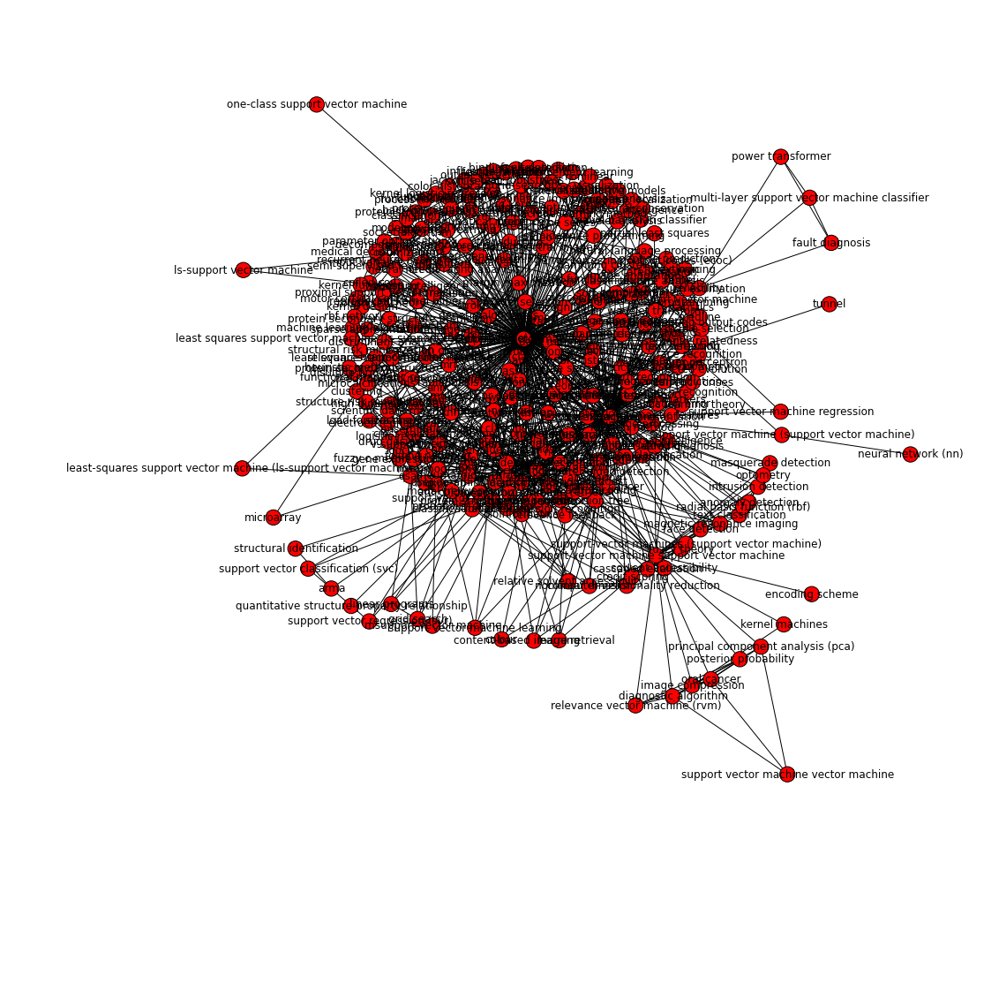

In [23]:
plt.figure(figsize=(15,15))
nx.draw_graphviz(most_inclusive_node, with_labels = True, labels = nx.get_node_attributes(most_inclusive_node, 'topic'))